In [2]:
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Audio

from perturbations.data.audio_io import load_performances, load_audio

from perturbations.consts import SAMPLE_RATE

from pathlib import Path

import librosa

/home/toni/projects/perturbations/audio


In [3]:
from pprint import pprint

In [4]:
y, sr = librosa.load(librosa.ex('fishin'), duration=5, offset=10)

Audio(data=y, rate=sr)

In [ ]:
audio_dir = Path("../audio/ween_rosesarefree/raw")
performances = load_performances(audio_dir)


KeyboardInterrupt: 

In [9]:
studio_dir = Path("../audio/studio/rosesarefree_studio.flac")

studio, sr_studio = librosa.load(studio_dir)

tempo_studio = librosa.feature.rhythm.tempo(y=studio, sr=sr_studio)

print(tempo_studio)

[92.28515625]


In [8]:
# Use tempogram for more detailed analysis
for name, perf in list(performances.items())[:3]:  # Test on first 3
    Audio(data=perf, rate=SAMPLE_RATE)
    tempogram = librosa.feature.tempogram(y=perf, sr=sr)
    tempo = librosa.beat.tempo(y=perf, sr=sr)
    print(f"{name}: {tempo}")

/tmp/ipykernel_13324/11529199.py:5: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=perf, sr=sr)


ween2000-05-08-d1t10: [92.28515625]
ween00.05.18d1T14: [92.28515625]
ween2003-10-03d1t17: [89.10290948]


In [1]:
import essentia.standard as es

results_essentia = {}
for name, perf in performances.items():
    rhythm_extractor = es.RhythmExtractor2013(method="multifeature")
    bpm, beats, beats_confidence, _, beats_intervals = rhythm_extractor(perf)
    results_essentia[name] = bpm
    print(f"{name}: {bpm:.2f} BPM")

[   INFO   ] MusicExtractorSVM: no classifier models were configured by default


NameError: name 'performances' is not defined

In [15]:
import madmom
import tempfile
import soundfile as sf

results_madmom = {}
for name, perf in performances.items():
    # Create temporary file
    with tempfile.NamedTemporaryFile(suffix='.wav', delete=False) as tmp:
        sf.write(tmp.name, perf, sr)
        
        # Process the temp file
        proc = madmom.features.beats.RNNBeatProcessor()
        act = proc(tmp.name)
        
        tempo_estimator = madmom.features.tempo.TempoEstimationProcessor(fps=100)
        tempo = tempo_estimator(act)
        
        results_madmom[name] = tempo[0][0] if len(tempo) > 0 else None
        print(f"{name}: {tempo}")

ImportError: cannot import name 'MutableSequence' from 'collections' (/home/toni/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/collections/__init__.py)

In [42]:
results = {}
for name, perf in performances.items():
    tempo, beats = librosa.beat.beat_track(y=perf, sr=sr)
    results[name] = tempo

pprint(results)

{'1-31-2008 Part_0108': array([89.10290948]),
 'ween00.05.18d1T14': array([92.28515625]),
 'ween1999-08-02t17': array([92.28515625]),
 'ween2000-05-08-d1t10': array([92.28515625]),
 'ween2000-05-09d1t05': array([92.28515625]),
 'ween2000-06-18d1t13': array([92.28515625]),
 'ween2003-10-03d1t17': array([89.10290948]),
 'ween2004-10-16_wiltern_t22': array([89.10290948]),
 'ween2008-03-07t17': array([89.10290948])}


In [38]:
print(performances.values())

dict_values([array([-0.09757583, -0.13551658, -0.09548562, ...,  0.00051083,
       -0.00183794,  0.00219996], shape=(8560104,), dtype=float32), array([-1.9993167e-06,  2.2170134e-06, -2.4084002e-06, ...,
        1.0129662e-01,  6.0116835e-02,  4.3610070e-02],
      shape=(9035208,), dtype=float32), array([0.00227779, 0.02184136, 0.02360017, ..., 0.        , 0.        ,
       0.        ], shape=(9238068,), dtype=float32), array([ 0.00264155,  0.00095815, -0.00256058, ...,  0.00230727,
       -0.00173298, -0.00437835], shape=(9617328,), dtype=float32), array([-0.03415293, -0.05792012, -0.04542184, ..., -0.15156445,
       -0.10438072, -0.03863842], shape=(8337408,), dtype=float32), array([ 0.00078031,  0.00235316,  0.00288652, ..., -0.01055659,
       -0.0103586 , -0.00888593], shape=(8366064,), dtype=float32), array([-1.8626451e-09, -6.9849193e-09,  3.3760443e-09, ...,
       -2.3027882e-05,  2.9772520e-05, -3.4667552e-05],
      shape=(9231600,), dtype=float32), array([-5.0710514e-07

In [35]:
results = list(map(lambda perf: librosa.beat.beat_track(y=perf, sr=sr), performances.values()))
tempos = [r[0] for r in results]
beats = [r[1] for r in results]

In [27]:
# 3. Run the default beat tracker

tempo, beat_frames = librosa.beat.beat_track(y=studio, sr=sr)


print(tempo)

[92.28515625]


In [21]:
D = librosa.stft(y=studio)

print(D)

[[-1.43727213e-01+0.0000000e+00j -4.06335384e-01+0.0000000e+00j
  -9.92026627e-02+0.0000000e+00j ... -1.32804558e-01+0.0000000e+00j
  -1.29489467e-01+0.0000000e+00j -9.81145054e-02+0.0000000e+00j]
 [ 8.55812281e-02-5.4218285e-02j -1.73638850e-01+4.8745234e-02j
  -2.07552761e-01+8.3620775e-01j ...  6.70713261e-02+5.9782527e-04j
   6.60964474e-02+2.2522430e-03j  6.14413098e-02+2.7442653e-02j]
 [-5.89177907e-02+6.0540801e-03j -5.64142764e-01-3.3016424e-03j
  -2.67396712e+00+9.0321255e-01j ...  1.06510495e-04-2.2439778e-04j
   1.96349487e-04-4.3388258e-04j -1.89865176e-02-4.6488182e-03j]
 ...
 [ 1.01906502e-04+7.0271767e-06j -5.63079157e-05-7.8490183e-07j
  -1.75030691e-05+2.0904617e-06j ... -1.26426105e-08+9.4631980e-10j
   7.05430239e-07-8.2215265e-06j -4.47580669e-06+5.2323197e-05j]
 [-1.06424479e-04-2.9356918e-06j -8.87452552e-06+5.4893266e-05j
  -1.84250348e-06-1.8434318e-06j ... -2.67682365e-09+1.5631851e-09j
   6.07697257e-06-5.5816681e-06j -3.55164193e-05-3.8686459e-05j]
 [ 1.02069

In [22]:
D_harmonic, D_percussive = librosa.decompose.hpss(D)

print(D_harmonic)

[[-1.3315578e-01+0.0000000e+00j -3.6294013e-03+0.0000000e+00j
  -2.7179343e-05+0.0000000e+00j ... -1.3270979e-01+0.0000000e+00j
  -1.2936351e-01+0.0000000e+00j -9.7903609e-02+0.0000000e+00j]
 [ 8.4324107e-02-5.3421866e-02j -8.4944880e-03+2.3846379e-03j
  -3.0246787e-04+1.2186106e-03j ...  6.6880219e-02+5.9612188e-04j
   6.5839946e-02+2.2435028e-03j  6.0916301e-02+2.7208159e-02j]
 [-5.8903944e-02+6.0526570e-03j -4.3175712e-01-2.5268560e-03j
  -4.0081173e-01+1.3538618e-01j ...  9.5378209e-06-2.0094412e-05j
   1.9681660e-05-4.3491480e-05j -4.0701291e-04-9.9656456e-05j]
 ...
 [ 1.8875261e-07+1.3015833e-08j -5.2747279e-08-7.3526851e-10j
  -3.7653889e-09+4.4971549e-10j ... -5.0981008e-11+3.8160104e-12j
   3.0868531e-13-3.5976122e-12j -4.8425168e-14+5.6610120e-13j]
 [-2.0020276e-07-5.5225415e-09j -3.3642382e-09+2.0809454e-08j
  -1.6033491e-10-1.6041569e-10j ... -9.7807144e-12+5.7116451e-12j
   2.4085926e-12-2.2122798e-12j -3.4805115e-13-3.7911669e-13j]
 [ 1.8164843e-07+0.0000000e+00j  1.61838

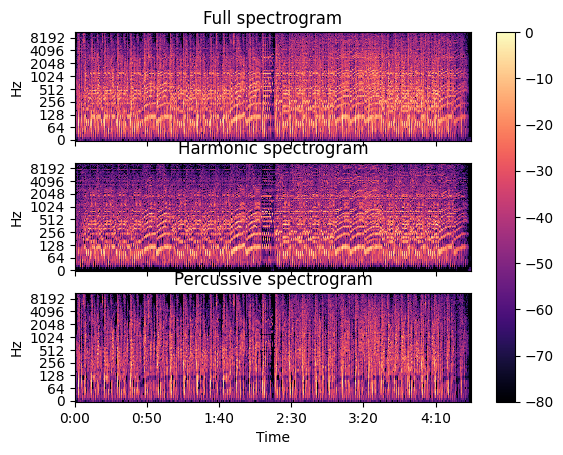

In [23]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True)

img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[0])
ax[0].set(title='Full spectrogram')
ax[0].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_harmonic), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='Harmonic spectrogram')
ax[1].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_percussive), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[2])
ax[2].set(title='Percussive spectrogram')
fig.colorbar(img, ax=ax)

In [25]:
y_harmonic = librosa.istft(D_percussive, length=len(studio))
Audio(data=y_harmonic, rate=sr)

In [28]:
tempo, beat_frames = librosa.beat.beat_track(y=y_harmonic, sr=sr)


print(tempo)

[92.28515625]
